# Visibility Prediction Based on Regression Algorithms
## Dataset: https://www.kaggle.com/datasets/budincsevity/szeged-weather

In [1]:
# Importing libraries

import pandas as pd
import numpy as np
import scipy.stats as stats


import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
import plotly.express as px


from sklearn.tree import DecisionTreeRegressor
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score

In [2]:
df = pd.read_csv("weatherHistory.csv")

# Getting to know the data & data cleaning

In [3]:
df.head()

,Formatted Date,Summary,Precip Type,Temperature (C),Apparent Temperature (C),Humidity,Wind Speed (km/h),Wind Bearing (degrees),Visibility (km),Loud Cover,Pressure (millibars),Daily Summary
0,2006-04-01 00:00:00.000 +0200,Partly Cloudy,rain,9.472222,7.388889,0.89,14.1197,251.0,15.8263,0.0,1015.13,Partly cloudy throughout the day.
1,2006-04-01 01:00:00.000 +0200,Partly Cloudy,rain,9.355556,7.227778,0.86,14.2646,259.0,15.8263,0.0,1015.63,Partly cloudy throughout the day.
2,2006-04-01 02:00:00.000 +0200,Mostly Cloudy,rain,9.377778,9.377778,0.89,3.9284,204.0,14.9569,0.0,1015.94,Partly cloudy throughout the day.
3,2006-04-01 03:00:00.000 +0200,Partly Cloudy,rain,8.288889,5.944444,0.83,14.1036,269.0,15.8263,0.0,1016.41,Partly cloudy throughout the day.
4,2006-04-01 04:00:00.000 +0200,Mostly Cloudy,rain,8.755556,6.977778,0.83,11.0446,259.0,15.8263,0.0,1016.51,Partly cloudy throughout the day.


In [4]:
# Rename columns

df = df.rename(columns={'Formatted Date':'Formatted_Date', 'Precip Type':'Precip_Type', 'Temperature (C)':'Temperature_C', 'Apparent Temperature (C)':'Apparent_Temperature_C', 'Wind Speed (km/h)':'Wind_Speed_kmh', 'Wind Bearing (degrees)':'Wind_Bearing_degrees', 'Visibility (km)':'Visibility_km', 'Loud Cover':'Loud_Cover', 'Pressure (millibars)':'Pressure_millibars', 'Daily Summary':'Daily_Summary'})

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96453 entries, 0 to 96452
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Formatted_Date          96453 non-null  object 
 1   Summary                 96453 non-null  object 
 2   Precip_Type             95936 non-null  object 
 3   Temperature_C           96453 non-null  float64
 4   Apparent_Temperature_C  96453 non-null  float64
 5   Humidity                96453 non-null  float64
 6   Wind_Speed_kmh          96453 non-null  float64
 7   Wind_Bearing_degrees    96453 non-null  float64
 8   Visibility_km           96453 non-null  float64
 9   Loud_Cover              96453 non-null  float64
 10  Pressure_millibars      96453 non-null  float64
 11  Daily_Summary           96453 non-null  object 
dtypes: float64(8), object(4)
memory usage: 8.8+ MB


In [6]:
# Counting number of distinct elements

df.nunique()

Formatted_Date            96429
Summary                      27
Precip_Type                   2
Temperature_C              7574
Apparent_Temperature_C     8984
Humidity                     90
Wind_Speed_kmh             2484
Wind_Bearing_degrees        360
Visibility_km               949
Loud_Cover                    1
Pressure_millibars         4979
Daily_Summary               214
dtype: int64

In [7]:
# Detecting missing values

df.isnull().sum()

Formatted_Date              0
Summary                     0
Precip_Type               517
Temperature_C               0
Apparent_Temperature_C      0
Humidity                    0
Wind_Speed_kmh              0
Wind_Bearing_degrees        0
Visibility_km               0
Loud_Cover                  0
Pressure_millibars          0
Daily_Summary               0
dtype: int64

In [8]:
#  Checking if we can recover missing data from another column

Precip_Type_null = df[df['Precip_Type'].isnull()]
Precip_Type_null

,Formatted_Date,Summary,Precip_Type,Temperature_C,Apparent_Temperature_C,Humidity,Wind_Speed_kmh,Wind_Bearing_degrees,Visibility_km,Loud_Cover,Pressure_millibars,Daily_Summary
52672,2012-04-11 16:00:00.000 +0200,Mostly Cloudy,NaN,19.016667,19.016667,0.26,14.8764,163.0,9.982,0.0,1002.40,Mostly cloudy until night.
52674,2012-04-11 18:00:00.000 +0200,Mostly Cloudy,NaN,17.850000,17.850000,0.28,13.7977,169.0,9.982,0.0,1001.79,Mostly cloudy until night.
52675,2012-04-11 19:00:00.000 +0200,Mostly Cloudy,NaN,16.322222,16.322222,0.32,10.8192,151.0,9.982,0.0,1001.60,Mostly cloudy until night.
52677,2012-04-11 21:00:00.000 +0200,Mostly Cloudy,NaN,12.566667,12.566667,0.43,9.0160,159.0,9.982,0.0,1001.92,Mostly cloudy until night.
52678,2012-04-11 22:00:00.000 +0200,Mostly Cloudy,NaN,12.927778,12.927778,0.47,17.6295,197.0,16.100,0.0,1002.20,Mostly cloudy until night.
...,...,...,...,...,...,...,...,...,...,...,...,...
95584,2016-10-31 19:00:00.000 +0100,Mostly Cloudy,NaN,8.322222,7.044444,0.85,8.0339,290.0,0.000,0.0,1021.73,Mostly cloudy starting in the afternoon.
95585,2016-10-31 20:00:00.000 +0100,Mostly Cloudy,NaN,7.627778,6.183333,0.87,8.2271,293.0,0.000,0.0,1021.76,Mostly cloudy starting in the afternoon.
95586,2016-10-31 21:00:00.000 +0100,Mostly Cloudy,NaN,7.111111,5.511111,0.89,8.5008,297.0,0.000,0.0,1021.81,Mostly cloudy starting in the afternoon.
95587,2016-10-31 22:00:00.000 +0100,Partly Cloudy,NaN,6.672222,4.961111,0.90,8.6457,299.0,0.000,0.0,1021.83,Mostly cloudy starting in the afternoon.


In [9]:
Precip_Type_null['Daily_Summary'].unique()

array(['Mostly cloudy until night.', 'Light rain in the morning.',
       'Mostly cloudy throughout the day.', 'Light rain until morning.',
       'Partly cloudy throughout the day.',
       'Light rain in the morning and afternoon.',
       'Partly cloudy until night and breezy in the afternoon.',
       'Mostly cloudy until evening.',
       'Partly cloudy starting overnight continuing until night.',
       'Partly cloudy starting in the morning.',
       'Partly cloudy starting in the afternoon.',
       'Mostly cloudy until morning.', 'Foggy starting in the evening.',
       'Foggy until morning.', 'Drizzle starting in the evening.',
       'Foggy overnight.', 'Overcast throughout the day.',
       'Rain until morning.',
       'Foggy starting overnight continuing until morning.',
       'Light rain overnight.', 'Rain until afternoon.',
       'Partly cloudy starting in the morning continuing until afternoon.',
       'Clear throughout the day.',
       'Mostly cloudy starting in t

In [10]:
# Unique values for the 'Precip Type' column

df['Precip_Type'].unique()

array(['rain', 'snow', nan], dtype=object)

In [11]:
# Adding rain value to 'Precip Type' column by column 'Daily Summary'

df['Precip_Type'] = df['Precip_Type'].mask(df['Daily_Summary'].str.contains('rain', case=False, na=False), 'rain')

# Another way:
# df.loc[df['Daily Summary'].str.lower().str.contains('rain'), 'Precip Type'] = 'rain'

In [12]:
# Adding 'no precipitation' value to 'Precip Type' column

df['Precip_Type'] = df['Precip_Type'].fillna('no precipitation')

In [13]:
# Validation of performed operations

df.isnull().sum()

Formatted_Date            0
Summary                   0
Precip_Type               0
Temperature_C             0
Apparent_Temperature_C    0
Humidity                  0
Wind_Speed_kmh            0
Wind_Bearing_degrees      0
Visibility_km             0
Loud_Cover                0
Pressure_millibars        0
Daily_Summary             0
dtype: int64

In [14]:
df.nunique()

Formatted_Date            96429
Summary                      27
Precip_Type                   3
Temperature_C              7574
Apparent_Temperature_C     8984
Humidity                     90
Wind_Speed_kmh             2484
Wind_Bearing_degrees        360
Visibility_km               949
Loud_Cover                    1
Pressure_millibars         4979
Daily_Summary               214
dtype: int64

The "Load Cover" column (which should probably be named "Cloud Cover") only has a value of 0. In meteorology, cloud cover is measured in oktas (where 0 oktas represents the complete absence of cloud and 9 oktas represents sky obscured by fog or other meteorological phenomena).

In [15]:
#  Checking if we can recover missing data from another column

df['Summary'].unique()

array(['Partly Cloudy', 'Mostly Cloudy', 'Overcast', 'Foggy',
       'Breezy and Mostly Cloudy', 'Clear', 'Breezy and Partly Cloudy',
       'Breezy and Overcast', 'Humid and Mostly Cloudy',
       'Humid and Partly Cloudy', 'Windy and Foggy', 'Windy and Overcast',
       'Breezy and Foggy', 'Windy and Partly Cloudy', 'Breezy',
       'Dry and Partly Cloudy', 'Windy and Mostly Cloudy',
       'Dangerously Windy and Partly Cloudy', 'Dry', 'Windy',
       'Humid and Overcast', 'Light Rain', 'Drizzle', 'Windy and Dry',
       'Dry and Mostly Cloudy', 'Breezy and Dry', 'Rain'], dtype=object)

In [16]:
# We can't accurately determine the degree of cloud cover, so I'm removing this column

df.drop("Loud_Cover", axis=1,  inplace=True)

In [17]:
# 1st Checkpoint

df_1 = df.copy()

# Exploratory Data Analysis

In [18]:
# Generating descriptive statistics

df_1.describe()

,Temperature_C,Apparent_Temperature_C,Humidity,Wind_Speed_kmh,Wind_Bearing_degrees,Visibility_km,Pressure_millibars
count,96453.000000,96453.000000,96453.000000,96453.000000,96453.000000,96453.000000,96453.000000
mean,11.932678,10.855029,0.734899,10.810640,187.509232,10.347325,1003.235956
std,9.551546,10.696847,0.195473,6.913571,107.383428,4.192123,116.969906
min,-21.822222,-27.716667,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.688889,2.311111,0.600000,5.828200,116.000000,8.339800,1011.900000
50%,12.000000,12.000000,0.780000,9.965900,180.000000,10.046400,1016.450000
75%,18.838889,18.838889,0.890000,14.135800,290.000000,14.812000,1021.090000
max,39.905556,39.344444,1.000000,63.852600,359.000000,16.100000,1046.380000


We have outliers in a 'Pressure 'column and the minimum value of the Visibility column is 0.

In [19]:
# Computing pairwise correlation of columns

df_1.corr()

,Temperature_C,Apparent_Temperature_C,Humidity,Wind_Speed_kmh,Wind_Bearing_degrees,Visibility_km,Pressure_millibars
Temperature_C,1.000000,0.992629,-0.632255,0.008957,0.029988,0.392847,-0.005447
Apparent_Temperature_C,0.992629,1.000000,-0.602571,-0.056650,0.029031,0.381718,-0.000219
Humidity,-0.632255,-0.602571,1.000000,-0.224951,0.000735,-0.369173,0.005454
Wind_Speed_kmh,0.008957,-0.056650,-0.224951,1.000000,0.103822,0.100749,-0.049263
Wind_Bearing_degrees,0.029988,0.029031,0.000735,0.103822,1.000000,0.047594,-0.011651
Visibility_km,0.392847,0.381718,-0.369173,0.100749,0.047594,1.000000,0.059818
Pressure_millibars,-0.005447,-0.000219,0.005454,-0.049263,-0.011651,0.059818,1.000000


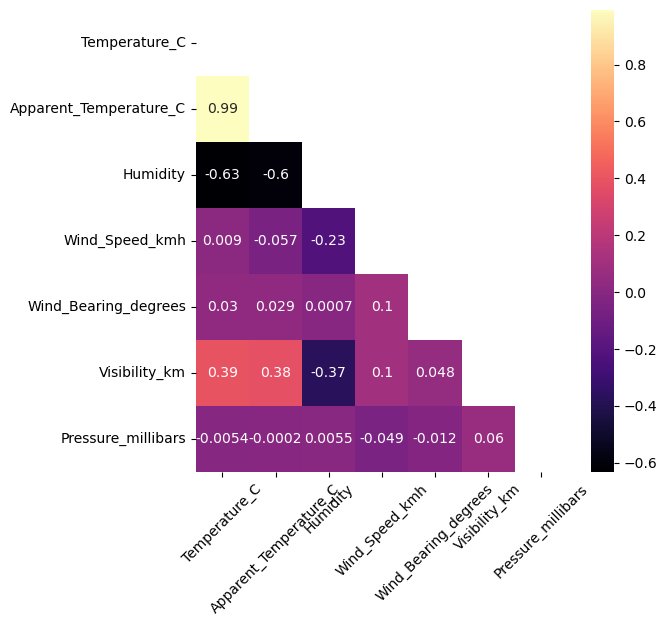

In [20]:
# Correlation plot

plt.figure(figsize=(6, 6))
mask = np.triu(np.ones_like(df_1.corr(), dtype=bool))
sns.heatmap(df_1.corr().round(4), mask=mask,
            annot=True, cmap='magma')
plt.xticks(rotation=45);

In [21]:
# Checking how many rows have zero pressure

df_1[df_1['Pressure_millibars']==0].shape[0]

1288

In [22]:
# Generating descriptive statistics for non-zero pressure values

pressure_greater_than_zero = df_1[df_1['Pressure_millibars']>0]
pressure_greater_than_zero['Pressure_millibars'].describe()

count    95165.000000
mean      1016.814140
std          7.778356
min        973.780000
25%       1012.120000
50%       1016.550000
75%       1021.160000
max       1046.380000
Name: Pressure_millibars, dtype: float64

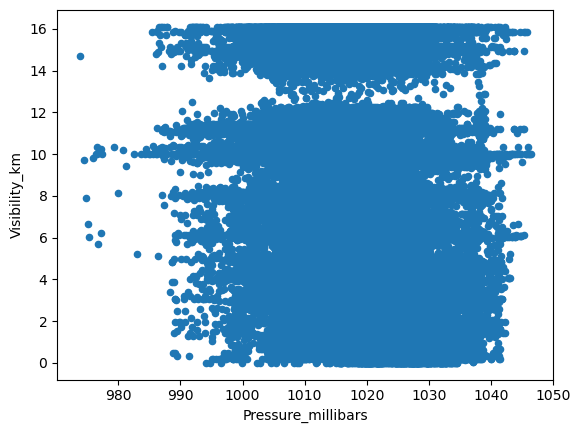

In [23]:
# Checking the relationship between visibility and pressure

pressure_greater_than_zero.plot.scatter(x="Pressure_millibars", y="Visibility_km")
plt.show()

In [24]:
# Removing outliers

df_1 = df_1.loc[(df_1["Pressure_millibars"]>0)]

In [25]:
# Checking how many rows have zero visibility


df_1[df_1['Visibility_km']==0].shape

(321, 11)

In [26]:
# Dropping rows where Visibility_km = 0, Precip_Type=no precipitation and Summary != Foggy

df_1.drop(df_1[(df_1['Visibility_km'] == 0) & (df_1['Precip_Type'] == 'no precipitation') & (df_1['Summary'] != 'Foggy')].index, axis=0, inplace=True)

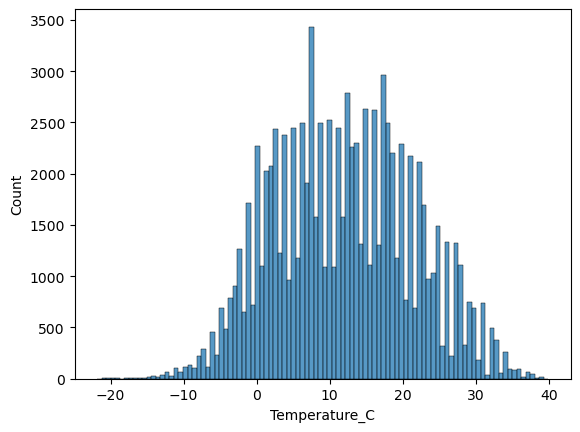

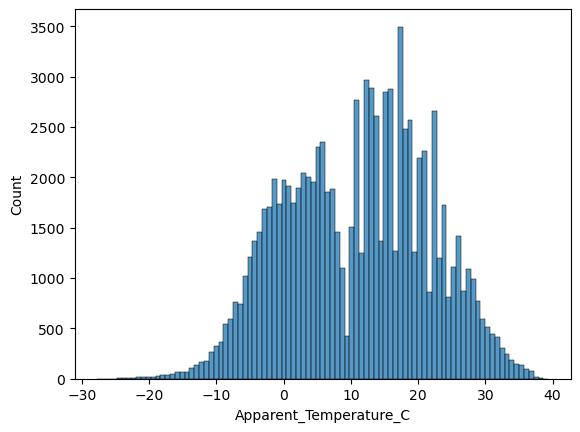

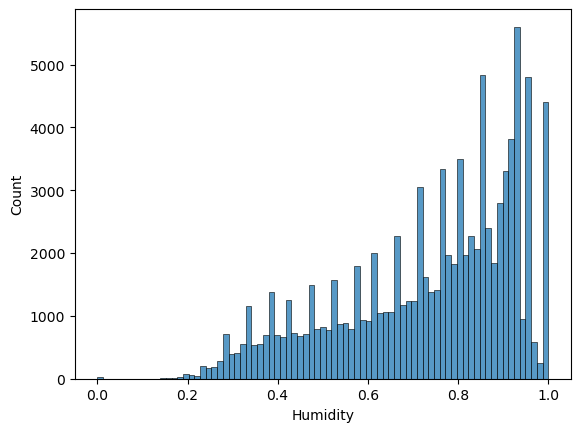

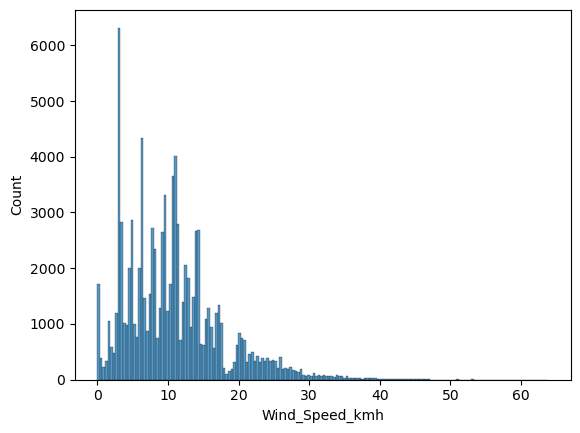

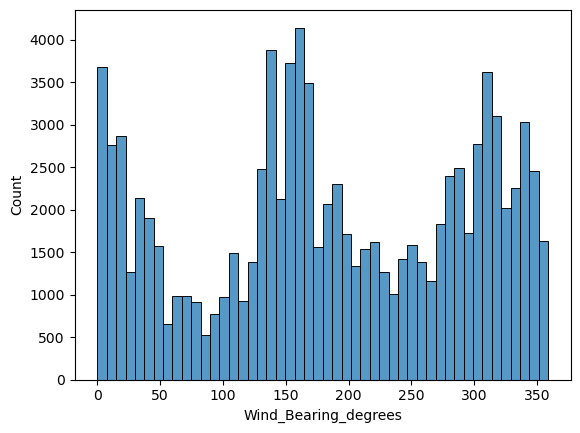

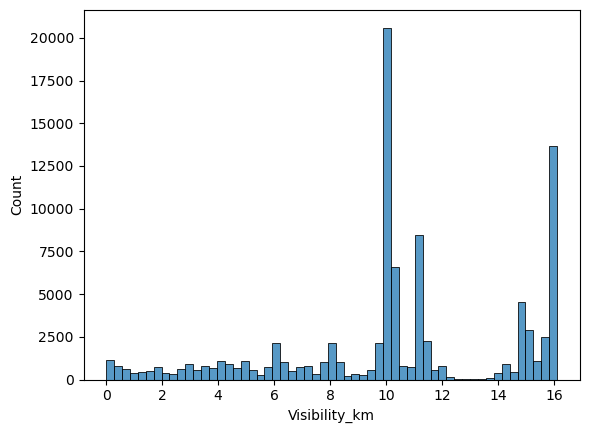

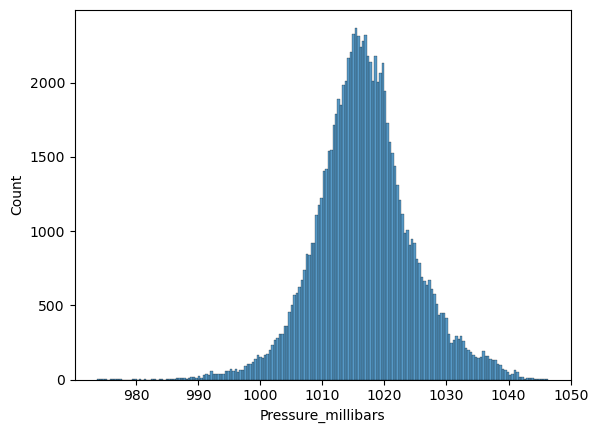

In [27]:
# Checking the distribution of numerical variables
num_columns = df_1.select_dtypes(include=[np.number]).columns.tolist()
for i  in num_columns:
    sns.histplot(df_1[i])
    plt.show()

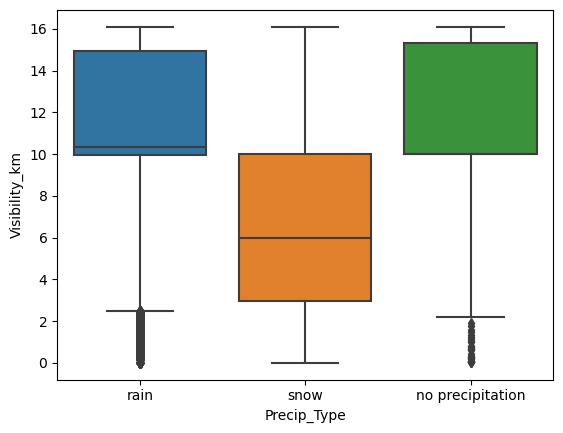

In [28]:
# Comparison of categorical variables with the target variable

sns.boxplot(data=df_1, x='Precip_Type', y='Visibility_km');

In [29]:
fig = px.scatter_3d(df_1, x="Temperature_C", y="Humidity", z="Visibility_km", color="Visibility_km")
fig.show()

In [30]:
# 2nd Checkpoint

df_2 = df_1.copy()

In [31]:
df_2.head()

,Formatted_Date,Summary,Precip_Type,Temperature_C,Apparent_Temperature_C,Humidity,Wind_Speed_kmh,Wind_Bearing_degrees,Visibility_km,Pressure_millibars,Daily_Summary
0,2006-04-01 00:00:00.000 +0200,Partly Cloudy,rain,9.472222,7.388889,0.89,14.1197,251.0,15.8263,1015.13,Partly cloudy throughout the day.
1,2006-04-01 01:00:00.000 +0200,Partly Cloudy,rain,9.355556,7.227778,0.86,14.2646,259.0,15.8263,1015.63,Partly cloudy throughout the day.
2,2006-04-01 02:00:00.000 +0200,Mostly Cloudy,rain,9.377778,9.377778,0.89,3.9284,204.0,14.9569,1015.94,Partly cloudy throughout the day.
3,2006-04-01 03:00:00.000 +0200,Partly Cloudy,rain,8.288889,5.944444,0.83,14.1036,269.0,15.8263,1016.41,Partly cloudy throughout the day.
4,2006-04-01 04:00:00.000 +0200,Mostly Cloudy,rain,8.755556,6.977778,0.83,11.0446,259.0,15.8263,1016.51,Partly cloudy throughout the day.


# Data Preprocessing & Feature Engineering

In [32]:
df_2.head(2)

,Formatted_Date,Summary,Precip_Type,Temperature_C,Apparent_Temperature_C,Humidity,Wind_Speed_kmh,Wind_Bearing_degrees,Visibility_km,Pressure_millibars,Daily_Summary
0,2006-04-01 00:00:00.000 +0200,Partly Cloudy,rain,9.472222,7.388889,0.89,14.1197,251.0,15.8263,1015.13,Partly cloudy throughout the day.
1,2006-04-01 01:00:00.000 +0200,Partly Cloudy,rain,9.355556,7.227778,0.86,14.2646,259.0,15.8263,1015.63,Partly cloudy throughout the day.


In [33]:
# Formatting the "Formatted_Date" column

df_2["Formatted_Date"] = df_2["Formatted_Date"].astype(str)
df_2['Date'] = df_2['Formatted_Date'].str[:10]
df_2['Date']

0        2006-04-01
1        2006-04-01
2        2006-04-01
3        2006-04-01
4        2006-04-01
            ...    
96448    2016-09-09
96449    2016-09-09
96450    2016-09-09
96451    2016-09-09
96452    2016-09-09
Name: Date, Length: 95013, dtype: object

In [34]:
# One-hot enconding

df_cat = pd.get_dummies(df_2['Precip_Type'], drop_first=True)
df_cat

,rain,snow
0,1,0
1,1,0
2,1,0
3,1,0
4,1,0
...,...,...
96448,1,0
96449,1,0
96450,1,0
96451,1,0


In [35]:
# Column connection

df_2 = df_2.join(df_cat)
df_2.columns

Index(['Formatted_Date', 'Summary', 'Precip_Type', 'Temperature_C',
       'Apparent_Temperature_C', 'Humidity', 'Wind_Speed_kmh',
       'Wind_Bearing_degrees', 'Visibility_km', 'Pressure_millibars',
       'Daily_Summary', 'Date', 'rain', 'snow'],
      dtype='object')

In [36]:
df_2.head(2)

,Formatted_Date,Summary,Precip_Type,Temperature_C,Apparent_Temperature_C,Humidity,Wind_Speed_kmh,Wind_Bearing_degrees,Visibility_km,Pressure_millibars,Daily_Summary,Date,rain,snow
0,2006-04-01 00:00:00.000 +0200,Partly Cloudy,rain,9.472222,7.388889,0.89,14.1197,251.0,15.8263,1015.13,Partly cloudy throughout the day.,2006-04-01,1,0
1,2006-04-01 01:00:00.000 +0200,Partly Cloudy,rain,9.355556,7.227778,0.86,14.2646,259.0,15.8263,1015.63,Partly cloudy throughout the day.,2006-04-01,1,0


In [37]:
# Preparation to copying the aggregation calculations on each of these groups

for i in list(df_2.columns):
    if i not in ['Formatted_Date', 'Precip_Type', 'Summary', 'Daily_Summary', 'Date']:
        print(f'{i} = ("{i}","mean"),')

Temperature_C = ("Temperature_C","mean"),
Apparent_Temperature_C = ("Apparent_Temperature_C","mean"),
Humidity = ("Humidity","mean"),
Wind_Speed_kmh = ("Wind_Speed_kmh","mean"),
Wind_Bearing_degrees = ("Wind_Bearing_degrees","mean"),
Visibility_km = ("Visibility_km","mean"),
Pressure_millibars = ("Pressure_millibars","mean"),
rain = ("rain","mean"),
snow = ("snow","mean"),


In [38]:
# Grouping by 'Date' column

df_agg = df_2.groupby('Date').agg(Temperature_C = ("Temperature_C","mean"),
                                Apparent_Temperature_C = ("Apparent_Temperature_C","mean"),
                                Humidity = ("Humidity","mean"),
                                Wind_Speed_kmh = ("Wind_Speed_kmh","mean"),
                                Wind_Bearing_degrees = ("Wind_Bearing_degrees","mean"),
                                Visibility_km = ("Visibility_km","mean"),
                                Pressure_millibars = ("Pressure_millibars","mean"),
                                rain = ("rain","mean"),
                                snow = ("snow","mean"))
df_agg.head(2)

,Temperature_C,Apparent_Temperature_C,Humidity,Wind_Speed_kmh,Wind_Bearing_degrees,Visibility_km,Pressure_millibars,rain,snow
Date,,,,,,,,,
2006-01-01,3.873148,-0.447222,0.818333,21.372750,142.041667,11.112354,1012.279167,1.0,0.0
2006-01-02,5.418519,2.042593,0.844583,17.551683,161.958333,8.956967,1010.131667,1.0,0.0


In [39]:
# Adding columns: 'Day_of_year', 'Month'

df_agg = df_agg.reset_index()
df_agg['Date'] = pd.to_datetime(df_agg['Date'])
df_agg['Day_of_year'] = df_agg['Date'].dt.dayofyear
df_agg['Month']  = df_agg['Date'].dt.month

In [40]:
df_agg.columns

Index(['Date', 'Temperature_C', 'Apparent_Temperature_C', 'Humidity',
       'Wind_Speed_kmh', 'Wind_Bearing_degrees', 'Visibility_km',
       'Pressure_millibars', 'rain', 'snow', 'Day_of_year', 'Month'],
      dtype='object')

In [41]:
# Changing the order of the columns


df_agg = df_agg[['Date','Month','Day_of_year','rain','snow', 'Temperature_C', 'Apparent_Temperature_C', 'Humidity',
       'Wind_Speed_kmh', 'Wind_Bearing_degrees', 'Pressure_millibars', 'Visibility_km']]
df_agg.head(1)

,Date,Month,Day_of_year,rain,snow,Temperature_C,Apparent_Temperature_C,Humidity,Wind_Speed_kmh,Wind_Bearing_degrees,Pressure_millibars,Visibility_km
0,2006-01-01,1,1,1.0,0.0,3.873148,-0.447222,0.818333,21.37275,142.041667,1012.279167,11.112354


In [42]:
df_processed = df_agg.copy()

# Exploratory Data Analysis #2

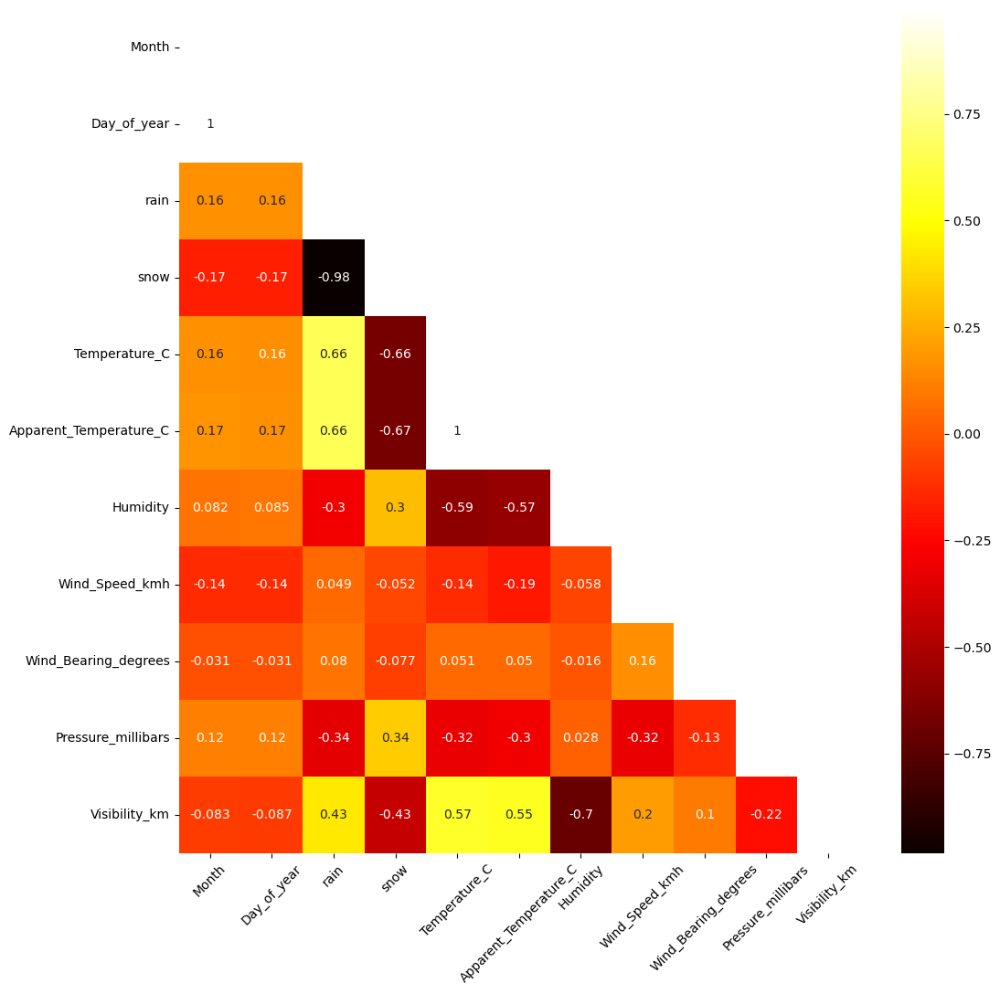

In [43]:
# Correlation plot

corr=df_processed.corr()
plt.figure(figsize=(12, 12))
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(df_processed.corr().round(4), mask=mask,annot=True,
cmap='hot')
plt.xticks(rotation=45);

In [44]:
# Generating descriptive statistics

df_processed.describe()

,Month,Day_of_year,rain,snow,Temperature_C,Apparent_Temperature_C,Humidity,Wind_Speed_kmh,Wind_Bearing_degrees,Pressure_millibars,Visibility_km
count,4013.000000,4013.000000,4013.000000,4013.000000,4013.000000,4013.000000,4013.000000,4013.000000,4013.000000,4013.000000,4013.000000
mean,6.518066,182.986544,0.885644,0.111159,11.931199,10.854779,0.735058,10.802713,187.560893,1016.804999,10.392965
std,3.448884,105.438194,0.272610,0.269638,8.782032,9.932941,0.134437,4.990320,67.071185,7.579212,3.200054
min,1.000000,1.000000,0.000000,0.000000,-15.773611,-18.886343,0.297917,1.245067,7.625000,982.551250,0.000000
25%,4.000000,92.000000,1.000000,0.000000,4.958565,2.775463,0.632727,7.176575,142.458333,1012.162500,8.952271
50%,7.000000,183.000000,1.000000,0.000000,12.257639,11.920139,0.743333,9.964558,183.333333,1016.555833,11.361233
75%,10.000000,274.000000,1.000000,0.000000,19.246759,19.238194,0.843333,13.313358,237.916667,1020.986250,12.115921
max,12.000000,366.000000,1.000000,1.000000,30.531481,29.850231,0.995000,36.002954,337.166667,1043.574167,15.924912


# Modeling

## Decision tree

In [45]:
# Selecting target and features

X = df_processed.drop(['Date', 'Apparent_Temperature_C', 'Visibility_km'], axis=1)
y = df_processed['Visibility_km']
X.columns

Index(['Month', 'Day_of_year', 'rain', 'snow', 'Temperature_C', 'Humidity',
       'Wind_Speed_kmh', 'Wind_Bearing_degrees', 'Pressure_millibars'],
      dtype='object')

In [46]:
# Splitting into train and test

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2, random_state=42)

In [47]:
# Training mogel - Decision Tree Regression
model_tree_1 = DecisionTreeRegressor(random_state=42, max_depth=5, min_samples_split=10)
model_tree_1.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=5, min_samples_split=10, random_state=42)

In [48]:
# Predicting the target variable

y_train_pred_tree_1 = model_tree_1.predict(X_train)
y_pred_tree_1 = model_tree_1.predict(X_test)

In [49]:
# Evaluating the Model

MAE_tree_1_train = round(mean_absolute_error(y_train, y_train_pred_tree_1),4)
R2_tree_1_train = round(r2_score(y_train, y_train_pred_tree_1),4)

MAE_tree_1 = round(mean_absolute_error(y_test, y_pred_tree_1),4)
R2_tree_1 = round(r2_score(y_test, y_pred_tree_1),4)
print('Evaluation of the 1st model\n')
print(f'Train Set:\nMAE: {MAE_tree_1_train}\nR2: {R2_tree_1_train}\n')
print(f'Test Set:\nMAE: {MAE_tree_1}\nR2: {R2_tree_1}')

Evaluation of the 1st model

Train Set:
MAE: 1.3047
R2: 0.7279

Test Set:
MAE: 1.4062
R2: 0.6333


In [50]:
# Parameter Tuning

from sklearn.model_selection import GridSearchCV

gs = GridSearchCV(model_tree_1,
                  param_grid = {'max_depth': range(1, 20),
                                'min_samples_split': range(5, 20)
                                },
                  cv=5
                  )
gs.fit(X_train,y_train)

print(gs.best_params_)

{'max_depth': 6, 'min_samples_split': 18}


In [51]:
# Choosing the best parameters

model_tree_2 = DecisionTreeRegressor(random_state=42, max_depth=6, min_samples_split=18)
model_tree_2.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=6, min_samples_split=18, random_state=42)

In [52]:
# Predicting the target variable

y_train_pred_tree_2 = model_tree_2.predict(X_train)
y_pred_tree_2 = model_tree_2.predict(X_test)

In [53]:
# Evaluating of the New Model

MAE_tree_2_train = round(mean_absolute_error(y_train, y_train_pred_tree_2),4)
R2_tree_2_train = round(r2_score(y_train, y_train_pred_tree_2),4)

MAE_tree_2 = round(mean_absolute_error(y_test, y_pred_tree_2),4)
R2_tree_2 = round(r2_score(y_test, y_pred_tree_2),4)

print('Evaluation of the 2nd model\n')
print(f'Train Set:\nMAE: {MAE_tree_2_train}\nR2: {R2_tree_2_train}\n')
print(f'Test Set:\nMAE: {MAE_tree_2}\nR2: {R2_tree_2}')

Evaluation of the 2nd model

Train Set:
MAE: 1.2363
R2: 0.7557

Test Set:
MAE: 1.3648
R2: 0.6627


The second model has better results

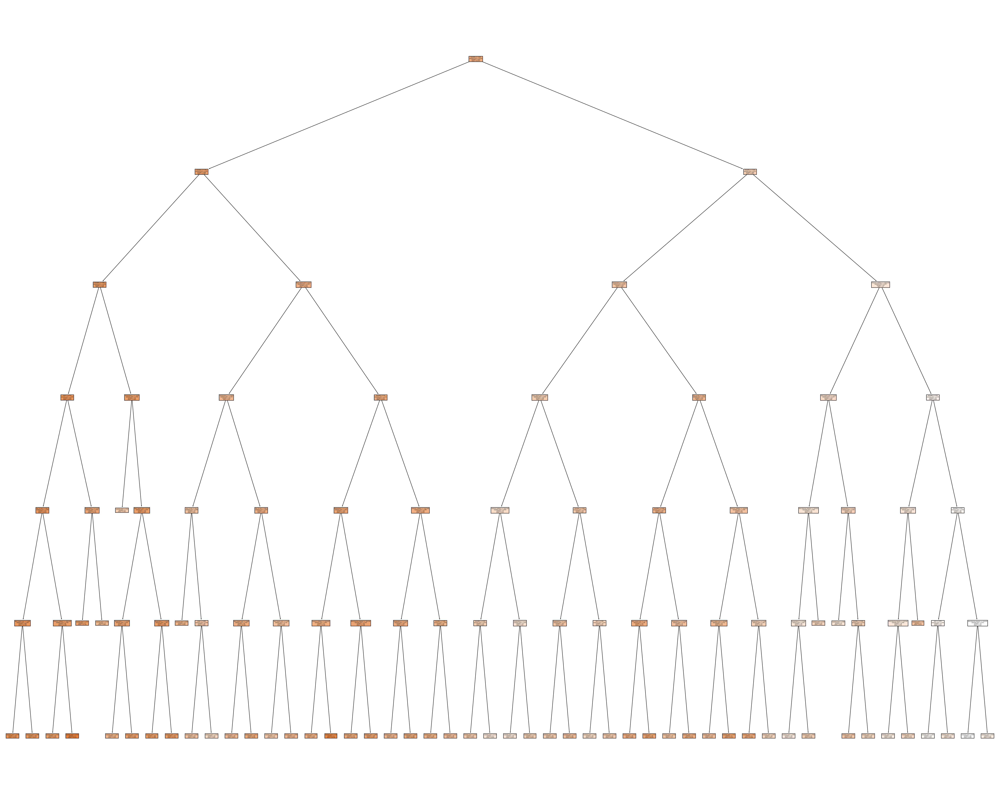

In [54]:
fig = plt.figure(figsize=(50,40), dpi=150)
tree_plot = tree.plot_tree(model_tree_2, feature_names=X.columns, filled=True)

In [55]:
# Check which variables have the greatest impact on the prediction

feat_importance = model_tree_2.tree_.compute_feature_importances(normalize=False)
feat_importance = pd.concat([X_train.columns.to_series().reset_index(drop=True), pd.Series(feat_importance)], axis=1)
feat_importance = feat_importance.sort_values(feat_importance.columns[1], ascending = False)
feat_importance.columns = ['Feature name', 'Coefficient']
feat_importance

,Feature name,Coefficient
5,Humidity,6.567954
4,Temperature_C,0.581298
6,Wind_Speed_kmh,0.312583
8,Pressure_millibars,0.224178
1,Day_of_year,0.112901
3,snow,0.033813
7,Wind_Bearing_degrees,0.029066
2,rain,0.022892
0,Month,0.000000


In [56]:
feat_importance.columns = ['Feature name', 'Coefficient']

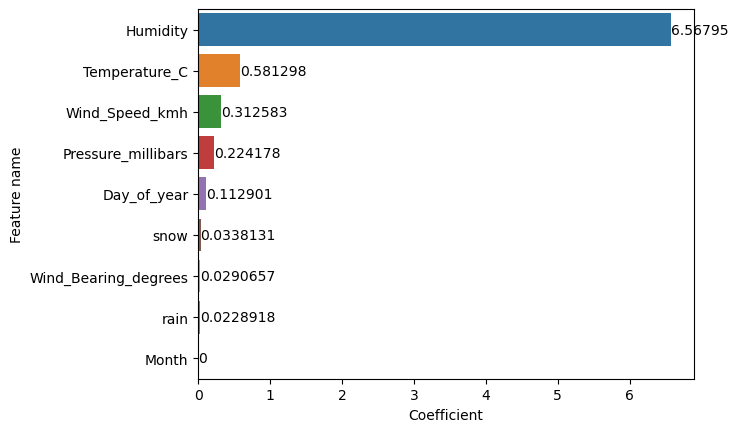

In [57]:
ax =sns.barplot(data=feat_importance, y='Feature name', x='Coefficient')
ax.bar_label(ax.containers[0],label_type='edge');

# Conclusions

Final model: model_tree_2 = DecisionTreeRegressor(random_state=42, max_depth=6, min_samples_split=18).<br>
Hyperparameters: max_depth and min_samples_split were optimized by cross-validated grid search over a parameter grid.<br>
The **MAE** and $R^2$ metrics were used to evaluate the model.<br>
There is some degree of overfitting of the model on the training set, which limits its ability to make predictions on new data.<br>
The feature that have the greatest impact on our model is humidity.<br>
In the next step we can add new new features from free open-source weather API.

#### API

In [58]:
# Url for period weather data: from 2006-01-01 to 2016-12-31

URL = 'https://archive-api.open-meteo.com/v1/archive?latitude=46.25&longitude=20.15&start_date=2006-01-01&end_date=2016-12-31&daily=rain_sum,snowfall_sum,precipitation_hours&timezone=Europe%2FBerlin'

In [59]:
# Connecting to url

import requests
response = requests.get(URL).json()
response.keys()

dict_keys(['latitude', 'longitude', 'generationtime_ms', 'utc_offset_seconds', 'timezone', 'timezone_abbreviation', 'elevation', 'daily_units', 'daily'])

In [60]:
response['daily'].keys()

dict_keys(['time', 'rain_sum', 'snowfall_sum', 'precipitation_hours'])

In [61]:
json_date = response['daily']['time']
json_rain_sum = response['daily']['rain_sum']
json_snowfall_sum = response['daily']['snowfall_sum']
json_precipitation_hours = response['daily']['precipitation_hours']

In [67]:
# Creating a dataframe

df_json = pd.DataFrame(data ={"Date": json_date, 'Rain_sum': json_rain_sum, 'Snowfall_sum': json_snowfall_sum, 'Precipitation_hours': json_precipitation_hours})
df_json.head()

,Date,Rain_sum,Snowfall_sum,Precipitation_hours
0,2006-01-01,0.8,0.0,3.0
1,2006-01-02,4.4,0.0,13.0
2,2006-01-03,0.0,0.0,0.0
3,2006-01-04,0.0,0.0,0.0
4,2006-01-05,3.9,0.0,13.0


In [74]:
# Changing the type of "Date" column

df_json['Date'] = pd.to_datetime(df_json['Date'])

In [68]:
df_json.shape

(4018, 4)

In [69]:
df_processed.shape

(4013, 12)

In [80]:
# Merging two data frames

df_merge = pd.merge(df_processed, df_json, on='Date')
df_merge.shape

(4013, 15)

In [85]:
df_merge.sample(5)

,Date,Month,Day_of_year,rain,snow,Temperature_C,Apparent_Temperature_C,Humidity,Wind_Speed_kmh,Wind_Bearing_degrees,Pressure_millibars,Visibility_km,Rain_sum,Snowfall_sum,Precipitation_hours
594,2007-08-18,8,230,1.000,0.000,23.294213,23.174537,0.597500,10.772913,259.125000,1014.881667,12.123971,0.5,0.0,1.0
1128,2009-02-02,2,33,0.875,0.125,2.977315,-0.189352,0.772500,14.237767,123.083333,1018.630417,11.649021,0.0,0.0,0.0
463,2007-04-09,4,99,1.000,0.000,11.371991,11.039352,0.547083,7.999017,255.125000,1018.929167,12.122629,0.0,0.0,0.0
1527,2010-03-08,3,67,0.375,0.625,-0.925000,-5.651620,0.680833,16.157021,38.708333,1022.813333,10.055792,0.0,0.0,0.0
799,2008-03-10,3,70,1.000,0.000,8.410185,7.280324,0.736250,12.744492,180.000000,1009.137500,8.753033,0.0,0.0,0.0
